# EXPERIMENTS IN SOCIAL INFLUENCE ANIMATIONS

In [1]:
def video(fname, mimetype):
    from IPython.display import HTML
    video_encoded = open(fname, "rb").read().encode("base64")
    video_tag = '<video controls alt="test" src="data:video/{0};base64,{1}">'.format(mimetype, video_encoded)
    return HTML(data=video_tag)
video("1dim_0_01_l10_r.mp4", "mp4")

In [1]:
from IPython.display import Image
# %matplotlib inline
# %matplotlib nbagg

In [2]:
# %load_ext sage

ImportError: No module named sage

In [2]:
from influence import influence_sim,infdif_sim,polinfluence_sim,cl_influence_sim
# from JSAnimation import IPython_display
from IPython.display import HTML

In [3]:
# Connected Erdos-Renyi random graph

nodes = 25
p = 0.2
iterations = 500

In [11]:
from influence_anim import graphs_G_F_1_create
# from infsim1 import update
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import itertools as it
from matplotlib.animation import FuncAnimation



from tempfile import NamedTemporaryFile

VIDEO_TAG = """<video controls>
 <source src="data:video/x-m4v;base64,{0}" type="video/mp4">
 Your browser does not support the video tag.
</video>"""

def anim_to_html(anim):
    if not hasattr(anim, '_encoded_video'):
        with NamedTemporaryFile(suffix='.mp4') as f:
            anim.save(f.name,writer='ffmpeg', fps=10, extra_args=['-vcodec', 'libx264'])# 'mencoder', fps=5)#, fps=20, extra_args=['-vcodec', 'libx264'])
            video = open(f.name, "rb").read()
        anim._encoded_video = video.encode("base64")
    
    return VIDEO_TAG.format(anim._encoded_video)



def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim_to_html(anim))

In [12]:
# nodes = 25
# iterations= 200
# sa = 0. #0.01
# sx=0.0000
# sa1= 0.9 #.000
# sa2=0.1 #.872
# sb=1 #.06

nodes = 30
source=[6,21]
p = 0#.7
k=4
iterations = 100
sa = 0 #0.01
sx=0.0000
sa1= 0.9 #.000
sa2=0.1 #.872
sb=.5

G,cols=graphs_G_F_1_create(nodes,sa,sb,p,iterations,source=[(0,0)],scale=1000,cols=[],osci=True)

fig = plt.figure()#figsize=(20,20))
ax1 = plt.subplot2grid((5,5), (0,0), colspan=4,rowspan=2)
pos=nx.graphviz_layout(G)
nc = np.array(cols[0])
nodes = nx.draw_networkx_nodes(G,pos,node_color=nc,node_size=100,nodelist=sorted(G.nodes()))
edges = nx.draw_networkx_edges(G,pos,alpha=.5) 
plt.axis('equal')
plt.axis('off')

def update(i):
    nc=np.array(cols[i])
    snc=sum(cols[i])*1.
    nodes.set_array(nc)
    ndnd=sorted(G.nodes())

    ax3 = plt.subplot2grid((5,5), (2,0),colspan=3,rowspan=2)
    plt.cla()
    plt.plot(ndnd,nc,'-o')

    sst='sb= %.2f Iteration %i' %(sb,i)
    plt.title(sst)
    plt.axis([-0.1, len(ndnd), -0.1, 1.1])
    
    ax2 = plt.subplot2grid((5,5), (2,4),rowspan=2)

    plt.cla()
    sst='Iteration %i' %i
    plt.title(sst)
    plt.plot([iii for iii in nc],
     [iii for iii in nc], '.')#,color=[str(iii) for iii in nc])
    plt.axis('image')
    plt.axis([-0.1, 1.1, -0.1, 1.1])
    return nodes,

anim = FuncAnimation(fig, update,frames=iterations-1)#,blit=True) # interval=iterations, blit=True)
# anim.save('infsim31.mp4',writer='ffmpeg', fps=5)#20)#mencoder'ffmpeg', fps=20)#, extra_args=['-vcodec', 'libx264'])
# plt.show()
display_animation(anim)

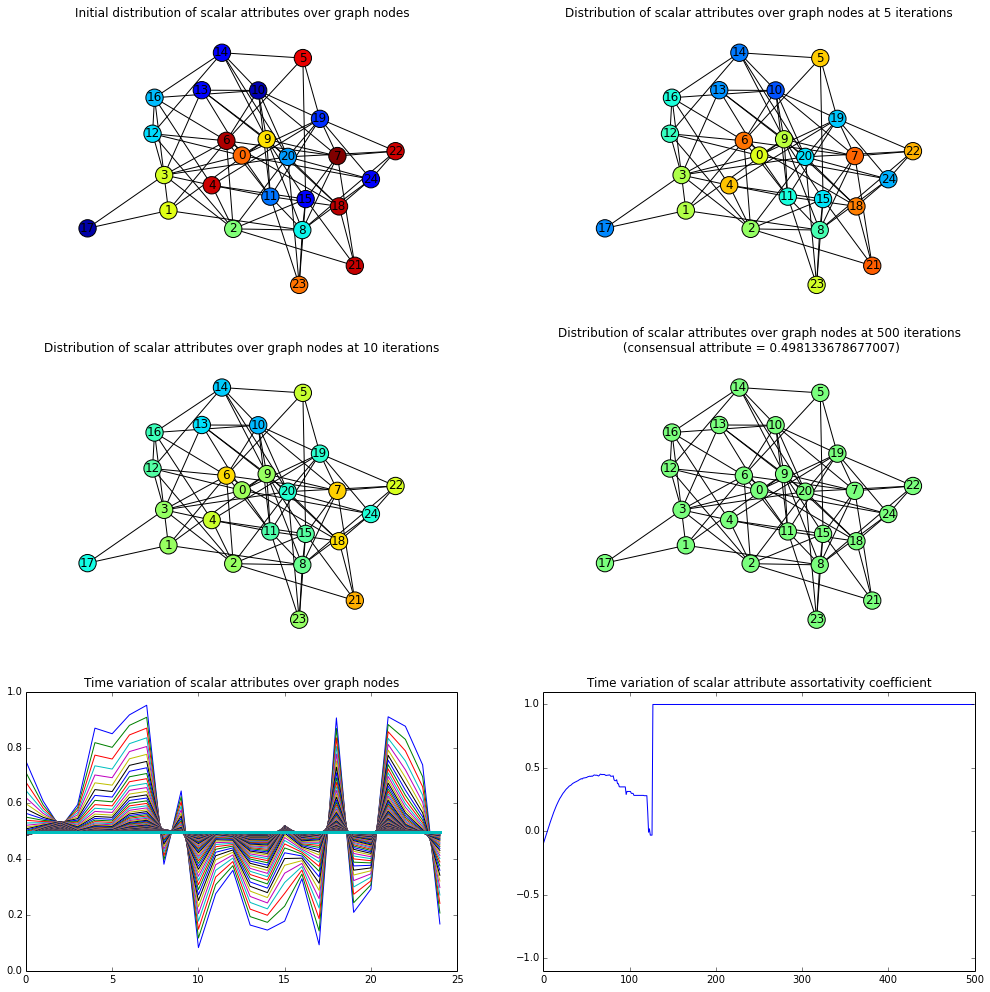

In [5]:
# Experiment B1: INFLUENCE 

# Susceptibility of all nodes (low)
sa = 0.1
influence_sim(nodes,p,sa,iterations)

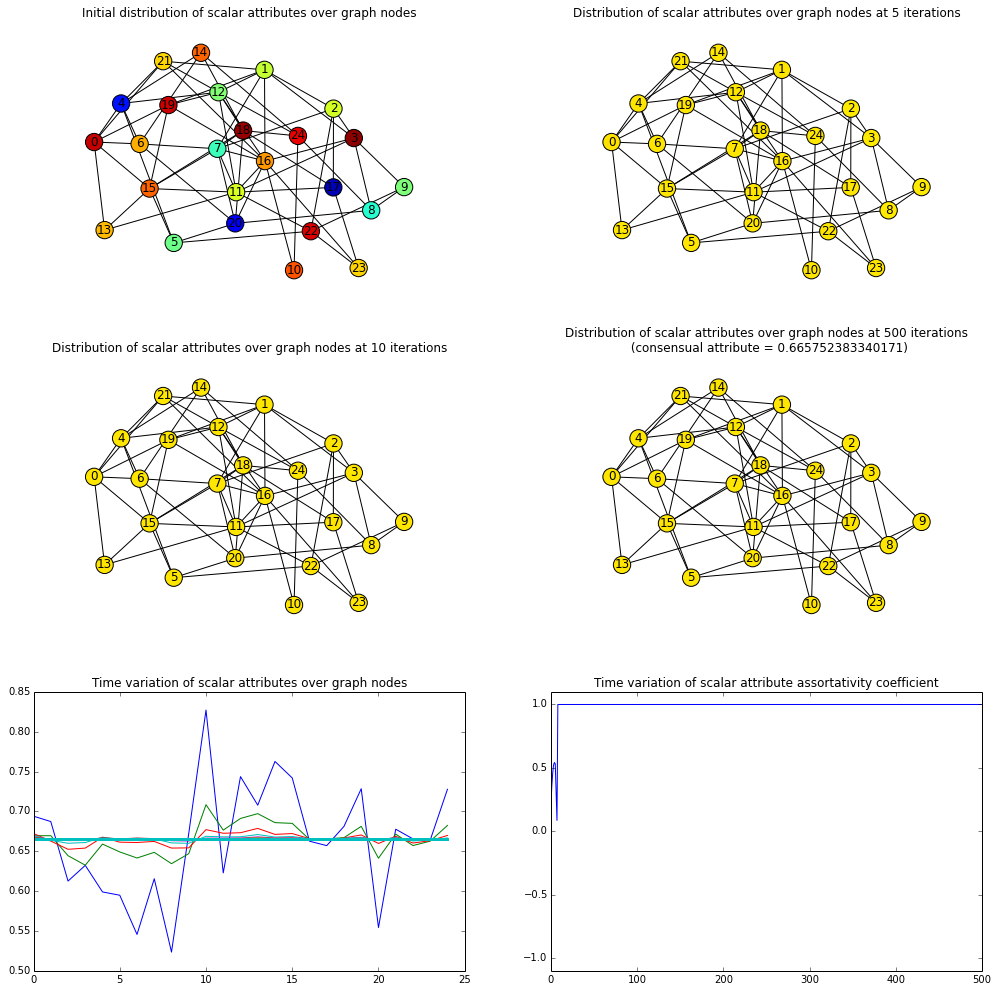

In [6]:
# Experiment B2: INFLUENCE 

# Susceptibility of all nodes (high)
sa = 0.9
influence_sim(nodes,p,sa,iterations)

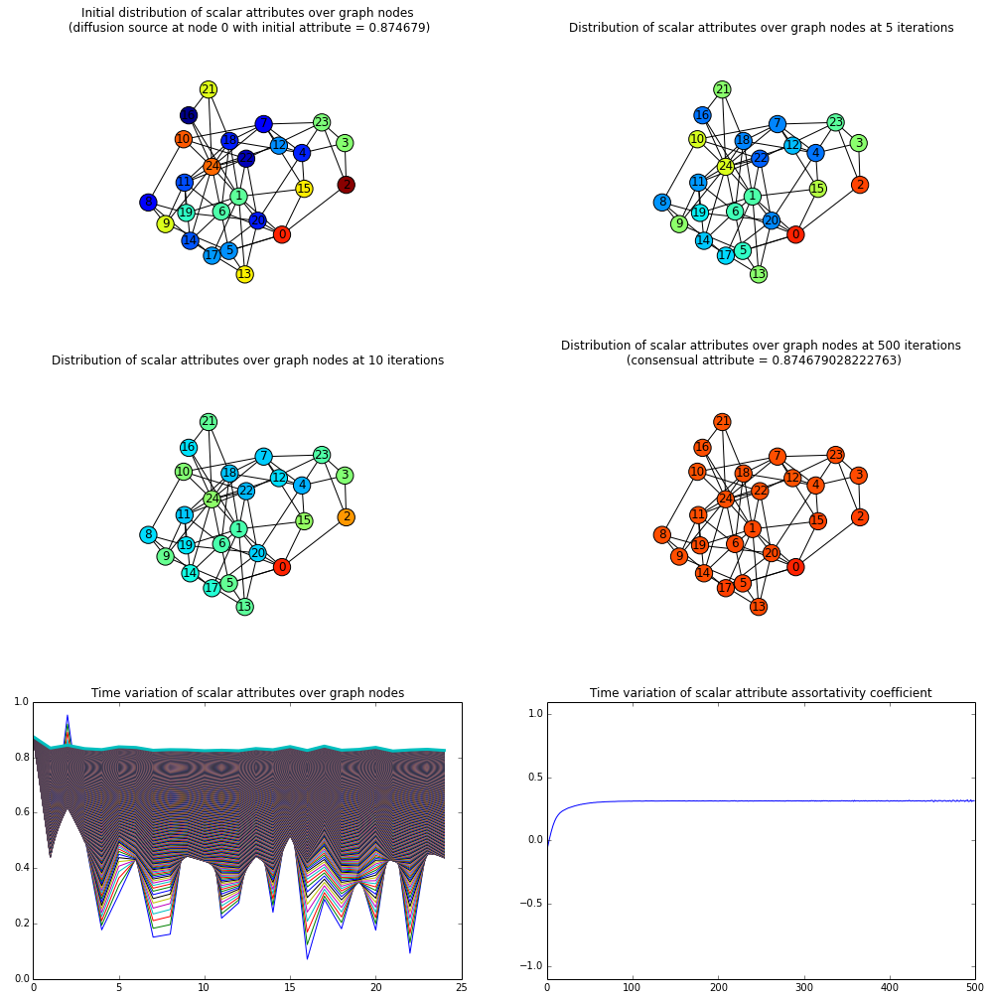

In [7]:
# Experiment B3: INFLUENCE 
# DIFFUSION BY INFLUENCE with heterogeneous susceptibilities

# Susceptibility of node 0 (the lowest)
sa = 0.
# Susceptibility of all other nodes (very low)
sb = 0.1
infdif_sim(nodes,p,sa,sb,iterations)

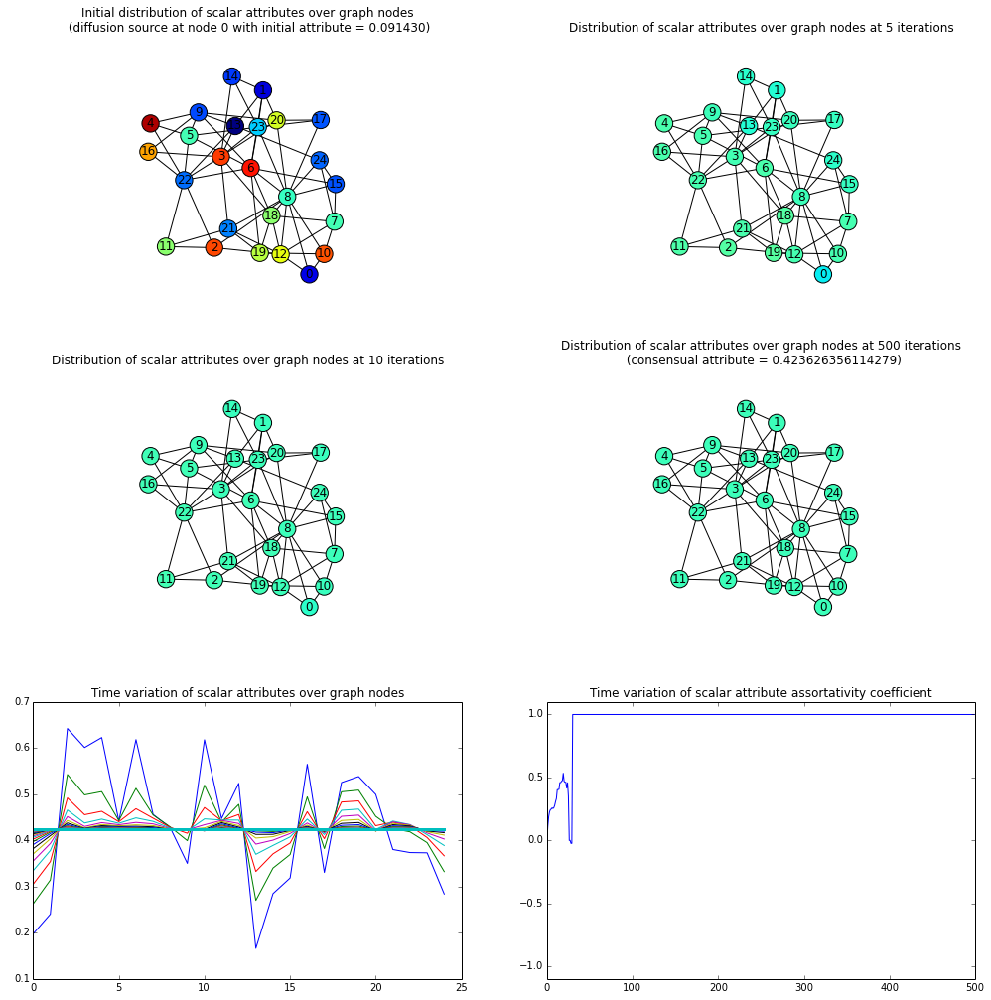

In [8]:
# Experiment B4: INFLUENCE 
# DIFFUSION BY INFLUENCE with heterogeneous susceptibilities

# Susceptibility of node 0 (low)
sa = 0.2
# Susceptibility of all other nodes (medium)
sb = 0.5
infdif_sim(nodes,p,sa,sb,iterations)

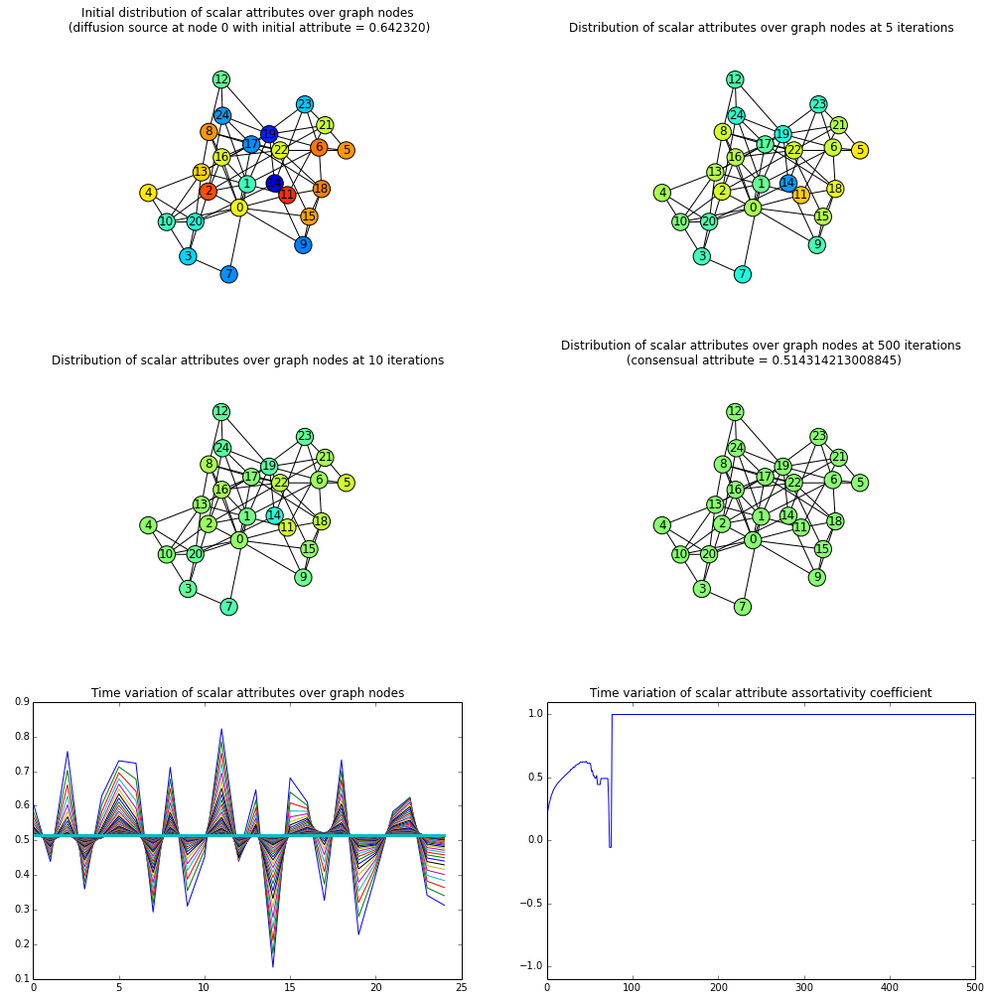

In [9]:
# Experiment B5: INFLUENCE 
# DIFFUSION BY INFLUENCE with heterogeneous susceptibilities

# Susceptibility of node 0 (medium)
sa = 0.4
# Susceptibility of all other nodes (low)
sb = 0.2
infdif_sim(nodes,p,sa,sb,iterations)

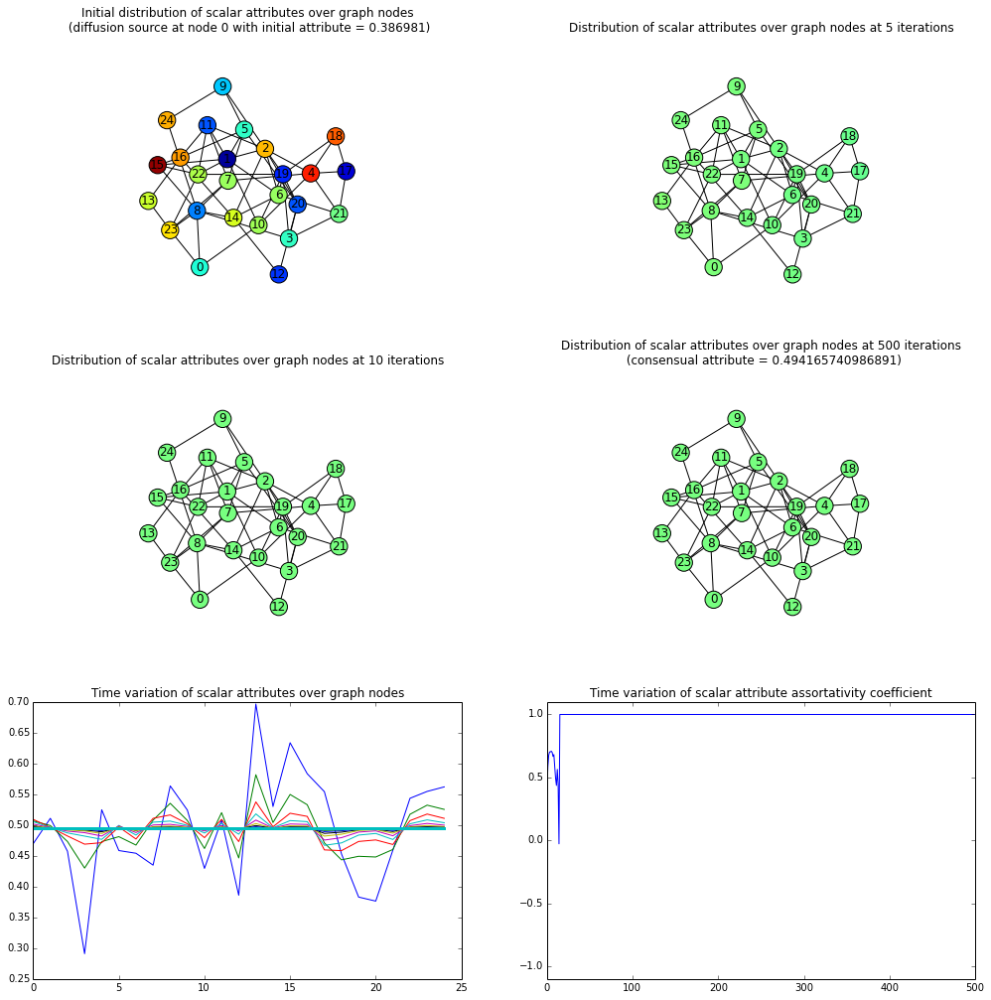

In [10]:
# Experiment B6: INFLUENCE 
# DIFFUSION BY INFLUENCE with heterogeneous susceptibilities

# Susceptibility of node 0 (high)
sa = 0.8
# Susceptibility of all other nodes (higher)
sb = 0.9
infdif_sim(nodes,p,sa,sb,iterations)

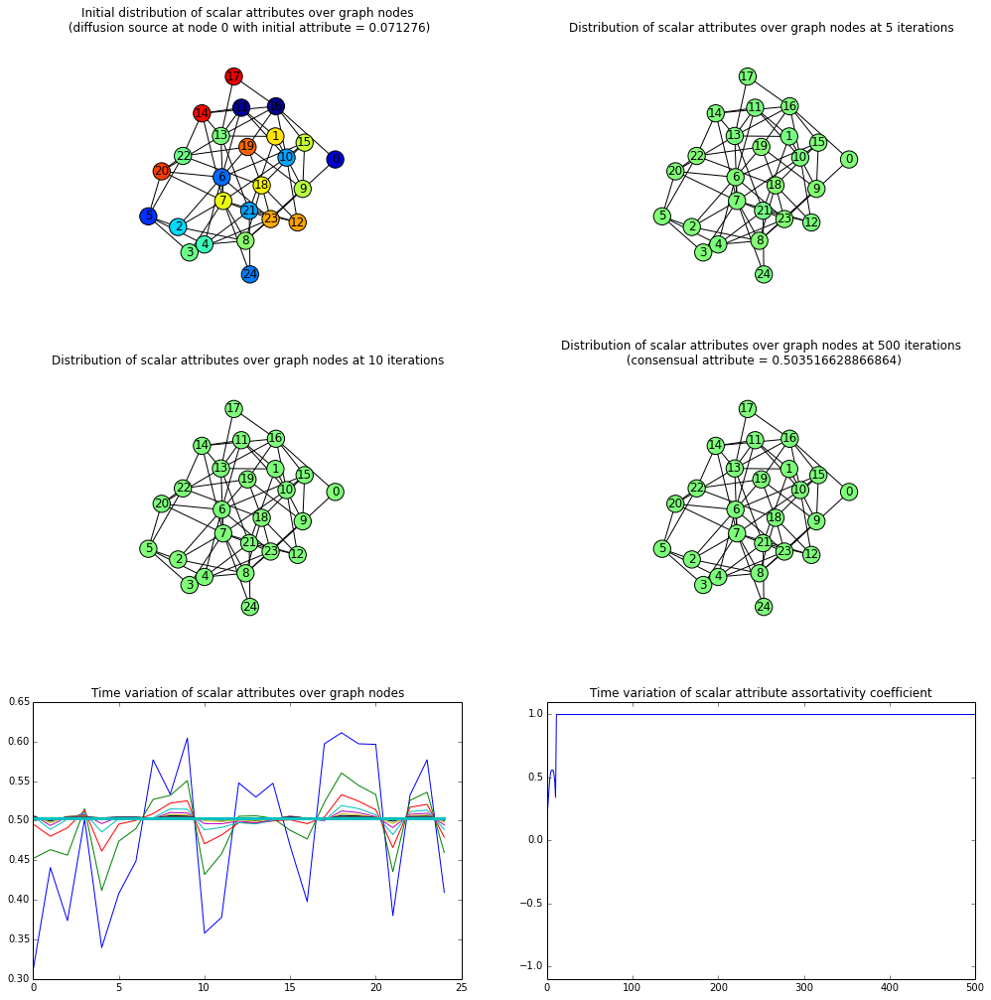

In [11]:
# Experiment B7: INFLUENCE 
# DIFFUSION BY INFLUENCE with heterogeneous susceptibilities

# Susceptibility of node 0 (high)
sa = 0.8
# Susceptibility of all other nodes (less high)
sb = 0.7
infdif_sim(nodes,p,sa,sb,iterations)

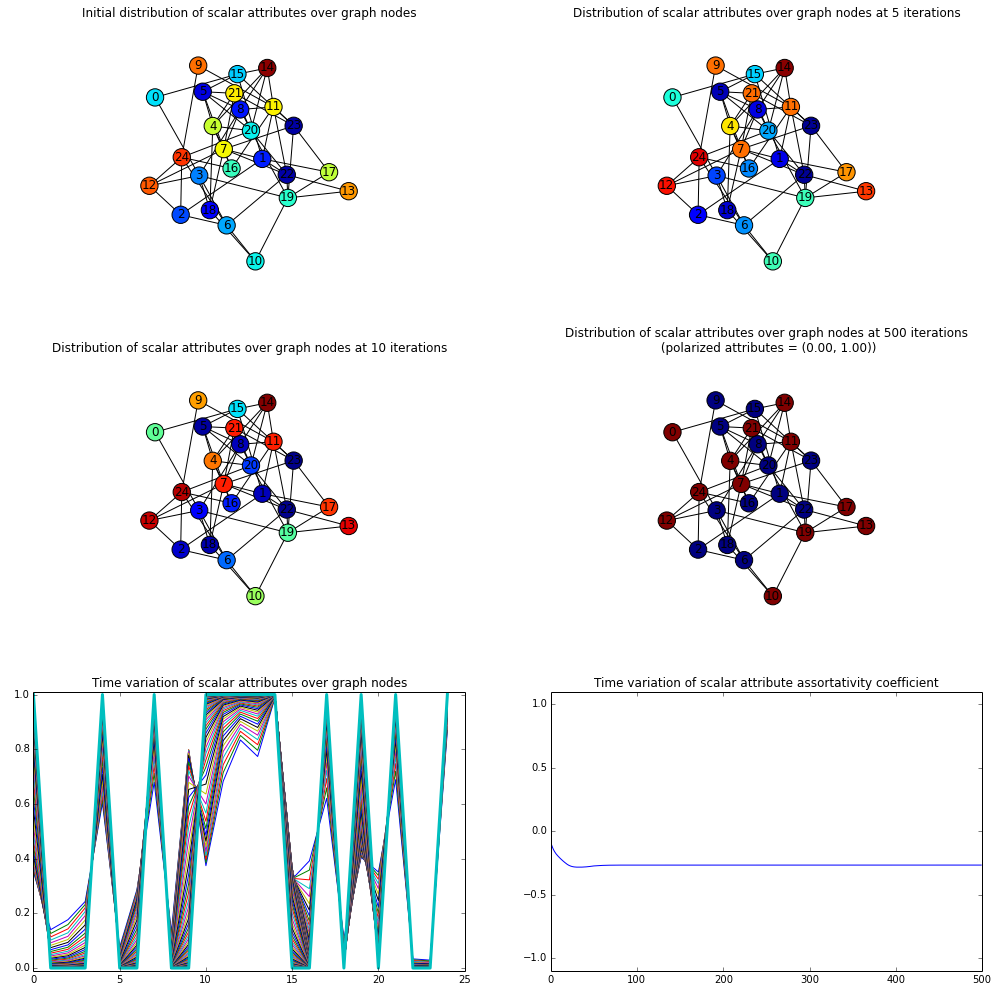

In [12]:
# Experiment B8: INFLUENCE 
# CONTRARIAN INFLUENCE 

# Susceptibility of all nodes (low)
sa = 0.1
polinfluence_sim(nodes,p,sa,iterations)

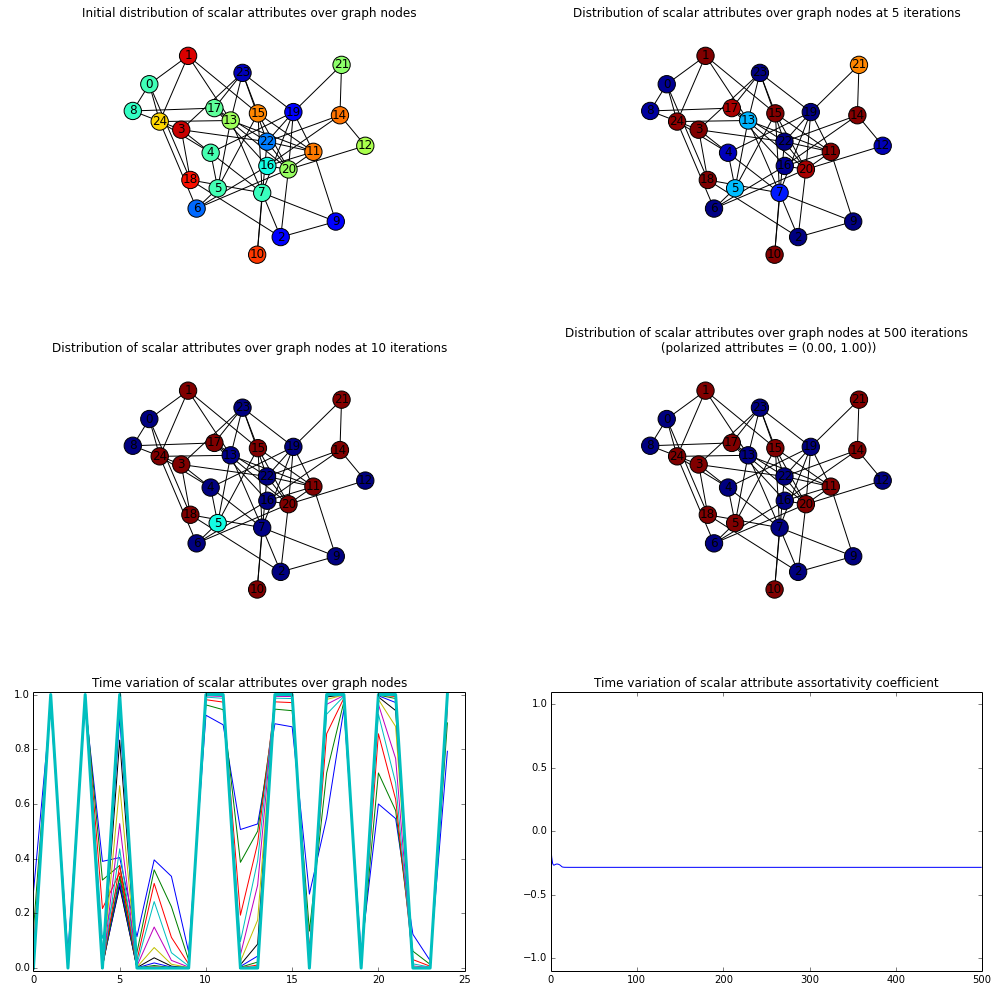

In [13]:
# Experiment B9: INFLUENCE 
# CONTRARIAN INFLUENCE 

# Susceptibility of all nodes (medium)
sa = 0.5
polinfluence_sim(nodes,p,sa,iterations)

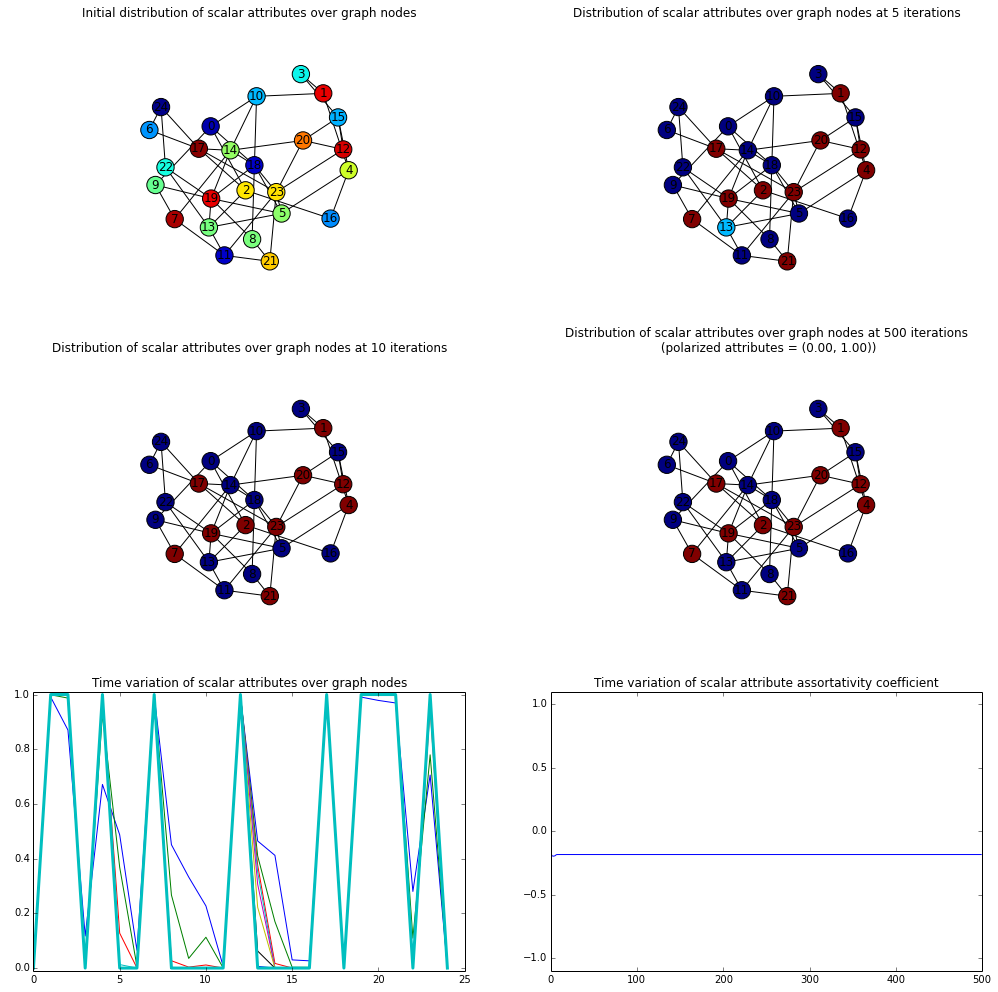

In [14]:
# Experiment B10: INFLUENCE 
# CONTRARIAN INFLUENCE 

# Susceptibility of all nodes (high)
sa = 0.9
polinfluence_sim(nodes,p,sa,iterations)

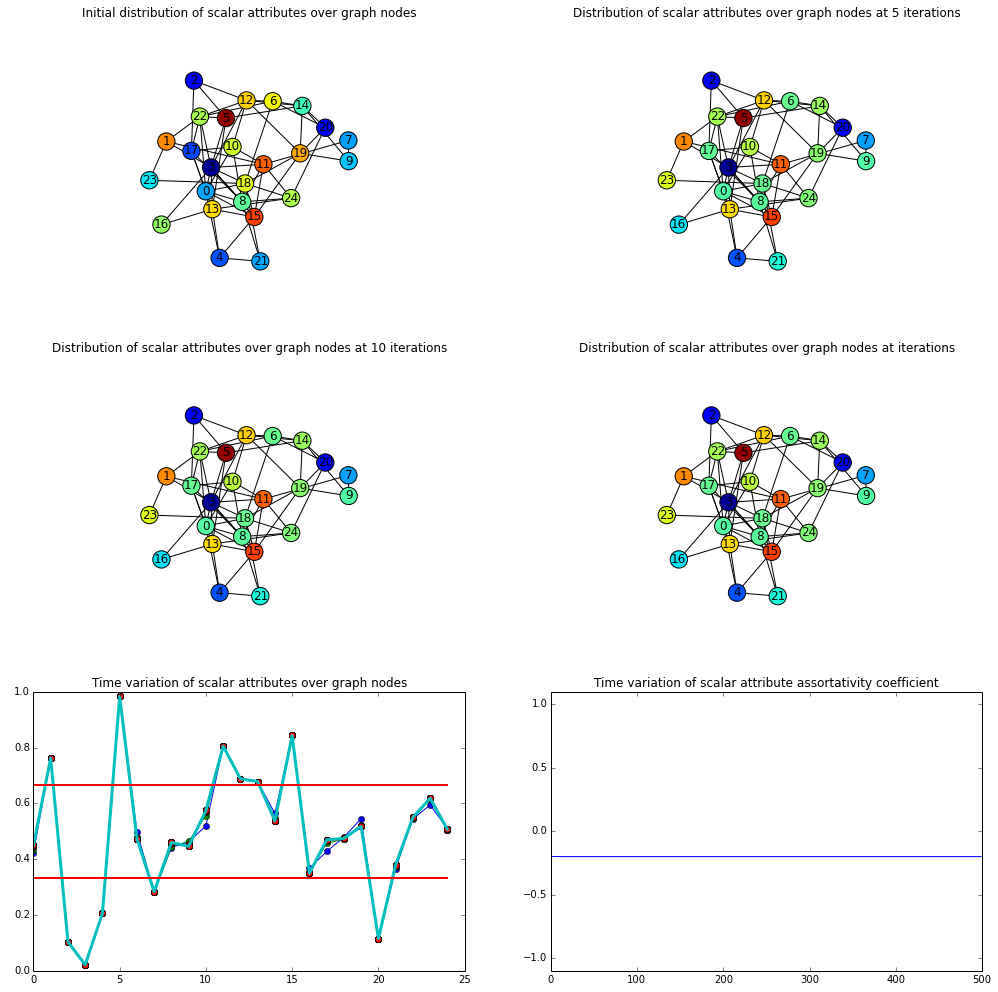

In [15]:
# Experiment B11: INFLUENCE 
# SEGREGATED INFLUENCE: The interval of attributes [0,1] is divided in three zones:
# [0,1/3), the "left",
# [1/3, 2/3), the "center",
# [2/3,1], the "right".
# * Persons in either one of the three zones interact as in Experiment 1 as far as their neighbors' attributes
# lie in the same zone with them.
# * Otherwize, persons in the "left" interact only with persons in the "center left" [1/3,1/2],
# persons in the "right" interact only with persons in the "center right" [1/2,2/3], while persons in the
# "left" do not interact with persons in the "right."
# The outcome is that persons' attributes are stabilized in a multiplicity of heterogeneous positions in the
# interval of attributes, i.e., complete dissensus emerges.


# Susceptibility of all nodes (high)
sa1 = 0.9 # high susceptibility inside the "left" and the "right"
sa2 = 0.1 # low susceptibility among "left" and "center left" and among "right and center right".
cl_influence_sim(nodes,p,sa1,sa2,iterations)